# Lab 2: Homography estimation and applications

In this lab you will learn how to estimate a homography relating two images given a set of correspondences between them. Then, you will work with different computer vision applications of the homography.

More precisely, the goals are:

1) Homography estimation with the DLT algorithm. <br>

2) Application: Image mosaics. <br>

3) Refinement of the estimated homography with the Gold Standard algorithm. <br>

4) Application: Camera calibration with a planar pattern and augmented reality. <br>

5) Application: Logo detection. <br>

6) Application: Logo replacement.

The following file combines some text cells (Markdown cells) and code cells. Some parts of the code need to be completed. All tasks you need to complete are marked in <span style='color:Green'> green.  </span>

In [1]:
import numpy as np
import cv2
import math
import sys
import matplotlib
from matplotlib import pyplot as plt
from operator import itemgetter
from utils import apply_H_fixed_image_size, plot_img, Ransac_DLT_homography
from scipy.optimize import least_squares
import random
from utils import DLT_homography

C:\Users\ialak\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## **1. Homography estimation with the DLT algorithm**

### **1.1 Compute image correspondences**
Execute the following code to find image correspondences using ORB [1] (you may also use SIFT, SURF, etc)

[1] Ethan Rublee, Vincent Rabaud, Kurt Konolige, Gary R. Bradski: ORB: An efficient alternative to SIFT or SURF. ICCV 2011: 2564-2571.

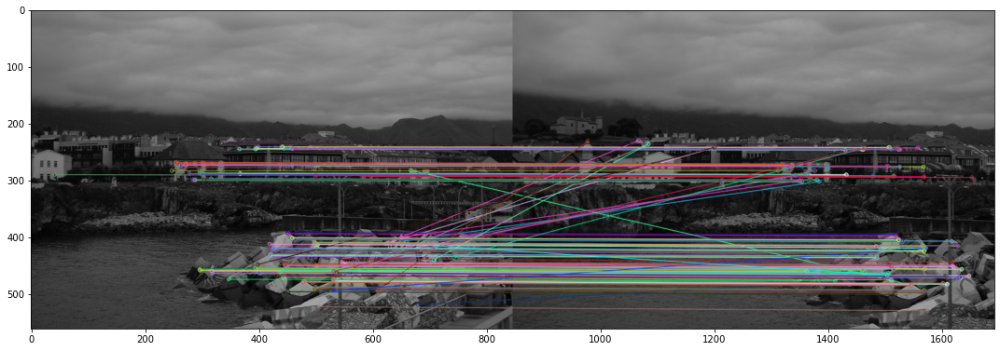

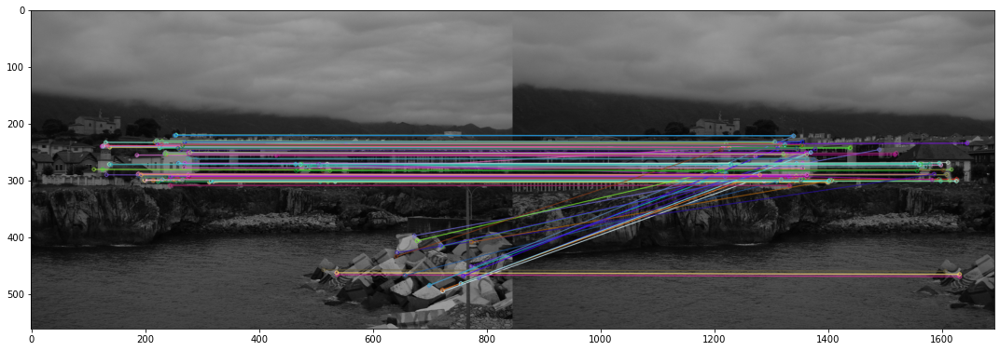

In [2]:
# Read images
img1 = cv2.imread('Data/llanes/llanes_a.jpg',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/llanes/llanes_b.jpg',cv2.IMREAD_GRAYSCALE)
img3 = cv2.imread('Data/llanes/llanes_c.jpg',cv2.IMREAD_GRAYSCALE)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
kp3, des3 = orb.detectAndCompute(img3,None)

# Keypoint matching
bf = cv2.BFMatcher()
matches_12 = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good_matches_12 = []
for m,n in matches_12:
    if m.distance < 0.85*n.distance:
        good_matches_12.append([m])

matches_23 = bf.knnMatch(des2,des3,k=2)
# Apply ratio test
good_matches_23 = []
for m,n in matches_23:
    if m.distance < 0.85*n.distance:
        good_matches_23.append([m])


# Show "good" matches 
img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,good_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

### **1.2 Compute the homography (DLT algorithm) between image pairs**

The following cell of code calls the 'Ransac_DLT_homography' function from utils.py
Before running the code of the cell you first need to complete some functions in utils.py that are called from 'Ransac_DLT_homography' function:

<span style='color:Green'> - Complete the 'DLT_homography' function that computes a homography from a set of point correspondences with the DLT algorithm.  </span>

<span style='color:Green'> - Complete the 'Inliers' function that, given a homography, a set of point correspondences and a certain threshold  returns the indices of the correspondences that are inliers.  </span>


In [17]:
def DLT_homography2(points1, points2):
    
    # ToDo: complete this code .......
    
    #---------------------------------
    # SLIDE 12 STEPS:
    
    # 1. For each correscpondence x_i <-> x'_i , compute A_i
    A = []
    
    p1T = points1.T
    p2T = points2.T
    
    for i in range(len(points1.T)):
        x1, y1, w1 = p1T[i]
        x2, y2, w2 = p2T[i]
        
        Ai = [[    0,     0,     0,  -w2*x1, -w2*y1, -w2*w1,   y2*x1,  y2*y1,  y2*w1],
              [w2*x1, w2*y1, w2*w1,       0,      0,      0,  -x2*x1, -x2*y1, -x2*w1]]
        
        
        A.append(Ai)
    
    # 2. Assemble the n matrices A_i to form the 2nx9 matrix A (in this case n=4)
    A = np.concatenate(A, axis=0)
    
        # Shape of A should be 2x4*9 = 8*9
    #print("A:", len(A), len(A[0]))
    
    
    # 3.1 Compute the SVD decomposition of A
    U, D, Vt = np.linalg.svd(A)
    
    # 3.2 h is the last column of V, and H is v reshaped by 3x3
    H = Vt[-1]
    H = H.reshape((3, 3))
    
    return H

def get_transformed_pixels_coords(I, H, shift=None):
    ys, xs = np.indices(I.shape[:2]).astype("float64")
    if shift is not None:
        ys += shift[1]
        xs += shift[0]
    ones = np.ones(I.shape[:2])
    coords = np.stack((xs, ys, ones), axis=2)
    coords_H = (H @ coords.reshape(-1, 3).T).T
    coords_H /= coords_H[:, 2, np.newaxis]
    cart_H = coords_H[:, :2]
    
    return cart_H.reshape((*I.shape[:2], 2))

"""
def Inliers2(H, points1, points2, th):
    
    # Check that H is invertible
    if abs(math.log(np.linalg.cond(H))) > 15:
        idx = np.empty(1)
        return idx
    
    
    # ToDo: complete this code .......
    
    # We have the Homography that relates points1 and points2, so 
    # we will compute the homography to the points 1 and
    # then check the distance with points2
    
    coords_p1_t = get_transformed_pixels_coords(points1, H)
    coords_p2_rw = get_transformed_pixels_coords(points2, np.identity(3))
    
    print(points1.shape)
    print(coords_p1_t.shape)
    #print(coords_p1_t)
    
    d = np.linalg.norm(coords_p1_t - coords_p2_rw, axis=2)
    
    print("d:", d.shape)
    
    inliers = np.where(d < th)
    print(inliers)
    
    return
"""

def Inliers2(H, points1, points2, th):
    
    # Check that H is invertible
    if abs(math.log(np.linalg.cond(H))) > 15:
        idx = np.empty(1)
        return idx
    
    
    # ToDo: complete this code .......
    
    num_points = points1.shape[1]
    inliers = []

    for i in range(num_points):
        # Transform points from the first image to the second image using the homography
        transformed_point = H @ points1[:, i]
        transformed_point /= transformed_point[2]  # Normalize by the homogeneous coordinate
        
        # Calculate Euclidean distance between transformed point and corresponding point in image 2
        dist = np.linalg.norm(transformed_point - points2[:, i])
        
        # Check if the distance is within the threshold
        if dist < th:
            inliers.append(i)
    
    inliers = np.array(inliers)
    return inliers


def Ransac_DLT_homography2(points1, points2, th, max_it):
    
    Ncoords, Npts = points1.shape
    
    it = 0
    best_inliers = np.empty(1)
    
    while it < max_it:
        indices = random.sample(range(1, Npts), 4)
        H = DLT_homography2(points1[:,indices], points2[:,indices])
        inliers = Inliers2(H, points1, points2, th)
        
        # test if it is the best model so far
        if inliers.shape[0] > best_inliers.shape[0]:
            best_inliers = inliers
        
        # update estimate of iterations (the number of trials) to ensure we pick, with probability p,
        # an initial data set with no outliers
        fracinliers = inliers.shape[0]/Npts
        pNoOutliers = 1 -  fracinliers**4
        eps = sys.float_info.epsilon
        pNoOutliers = max(eps, pNoOutliers)   # avoid division by -Inf
        pNoOutliers = min(1-eps, pNoOutliers) # avoid division by 0
        p = 0.99
        max_it = math.log(1-p)/math.log(pNoOutliers)
        
        it += 1
    
    # compute H from all the inliers
    H = DLT_homography2(points1[:,best_inliers], points2[:,best_inliers])
    inliers = best_inliers
    
    return H, inliers

def estimate_homography_inliers(kpA, kpB, good_matches_AB):
    pointsA = np.array([[kpA[m[0].queryIdx].pt[0], kpA[m[0].queryIdx].pt[1], 1] for m in good_matches_AB]).T
    pointsB = np.array([[kpB[m[0].trainIdx].pt[0], kpB[m[0].trainIdx].pt[1], 1] for m in good_matches_AB]).T

    H_AB, indices_inlier_matches_AB = Ransac_DLT_homography2(pointsA, pointsB, 3, 1000)
    
    return pointsA, pointsB, H_AB, indices_inlier_matches_AB

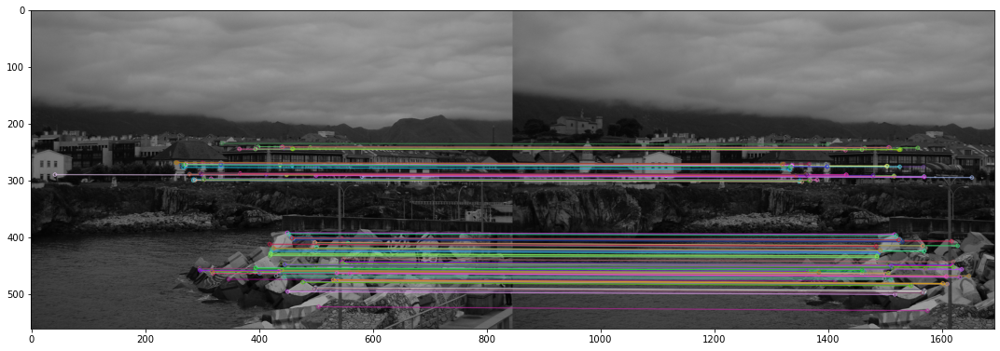

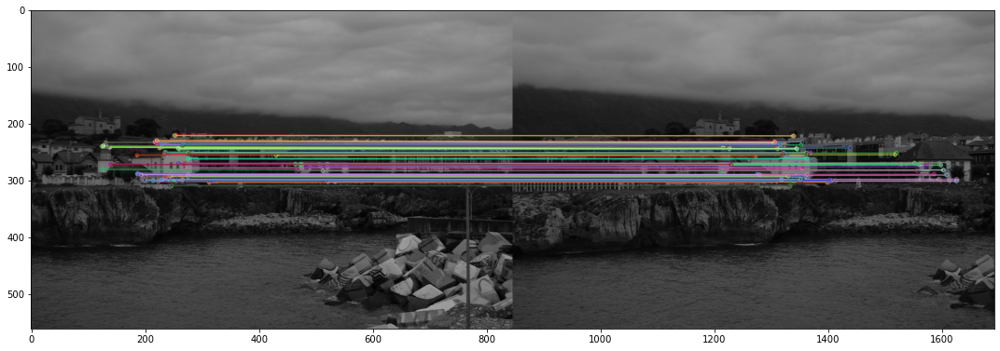

In [18]:
# Homography between images 1 and 2
points1 = []
points2 = []
for m in good_matches_12:
    points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
    points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

#print("p1", points1.shape, points1)

H_12, indices_inlier_matches_12 = Ransac_DLT_homography2(points1, points2, 3, 1000)
inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

# Homography between images 2 and 3
points2 = []
points3 = []
for m in good_matches_23:
    points2.append([kp2[m[0].queryIdx].pt[0], kp2[m[0].queryIdx].pt[1], 1])
    points3.append([kp3[m[0].trainIdx].pt[0], kp3[m[0].trainIdx].pt[1], 1])
    
points2 = np.asarray(points2)
points2 = points2.T
points3 = np.asarray(points3)
points3 = points3.T

H_23, indices_inlier_matches_23 = Ransac_DLT_homography2(points2, points3, 3, 1000)
inlier_matches_23 = itemgetter(*indices_inlier_matches_23)(good_matches_23)

img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,inlier_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_23)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

## **2. Application: Image mosaics**

Now that the homographies relating the images have been estimated we can create a mosaic by properly transforming and fusing the different image contents.
For that we create a big enough canvas where the mosaic will be created. The function 'apply_H_fixed_image_size' is provided in utils.py, it is a variant of the 'apply_H' function from lab 1 where this time the size of the transformed is fixed and given as an extra input.

<span style='color:Green'> - Complete the 2nd input argument to the 'apply_H_fixed_image_size' function in order to get the image mosaic. </span>

True

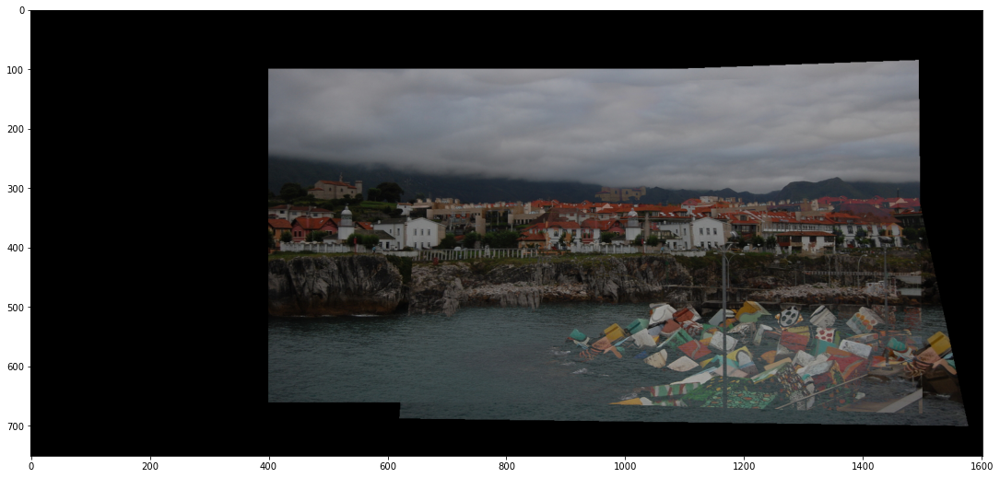

In [5]:
corners = [-400, 1200, -100, 650] # corners of the canvas where the mosaic will be created

img1c = cv2.imread('Data/llanes/llanes_a.jpg',cv2.IMREAD_COLOR)
img2c = cv2.imread('Data/llanes/llanes_b.jpg',cv2.IMREAD_COLOR)
img3c = cv2.imread('Data/llanes/llanes_c.jpg',cv2.IMREAD_COLOR)
img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

#plt.imshow(img1c)

#H12, _ = Ransac_DLT_homography2(points1, points2, th, max_it) 


img1c_w = apply_H_fixed_image_size(img1c, H_12, corners) # complete the call to the function
img2c_w = apply_H_fixed_image_size(img2c, np.identity(3), corners) # complete the call to the function
img3c_w = apply_H_fixed_image_size(img3c, H_23, corners) # complete the call to the function

img_mosaic = np.maximum(img3c_w,np.maximum(img1c_w,img2c_w))
plot_img(img_mosaic)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
cv2.imwrite('mosaic_llanes.png', img_mosaic) 


<span style='color:Green'> - Compute the mosaic with castle_int images. </span>

<span style='color:Green'> - Compute the mosaic with aerial images set 13 </span>

<span style='color:Green'> - Compute the mosaic with aerial images set 22 </span>

<span style='color:Green'> - In the report, comment the results in every of the four cases: hypothetise why it works or does not work </span>

In [6]:
import os

def image_mosaics(folder):
    filename = os.listdir(folder)
    path1 = os.path.join(folder, filename[0])
    path2 = os.path.join(folder, filename[1])
    path3 = os.path.join(folder, filename[2])
    
    # Read images
    img1 = cv2.imread(path1, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(path2, cv2.IMREAD_GRAYSCALE)
    img3 = cv2.imread(path3, cv2.IMREAD_GRAYSCALE)

    # Initiate ORB detector
    orb = cv2.ORB_create()
    # find the keypoints and descriptors with ORB
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)
    kp3, des3 = orb.detectAndCompute(img3,None)

    # Keypoint matching
    bf = cv2.BFMatcher()
    matches_12 = bf.knnMatch(des1,des2,k=2)
    # Apply ratio test
    good_matches_12 = []
    for m,n in matches_12:
        if m.distance < 0.85*n.distance:
            good_matches_12.append([m])

    matches_23 = bf.knnMatch(des2,des3,k=2)
    # Apply ratio test
    good_matches_23 = []
    for m,n in matches_23:
        if m.distance < 0.85*n.distance:
            good_matches_23.append([m])


    # Show "good" matches 
    img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(img_12)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()

    img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,good_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(img_23)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()
       
    # Homography between images 1 and 2
    points1 = []
    points2 = []
    for m in good_matches_12:
        points1.append([kp1[m[0].queryIdx].pt[0], kp1[m[0].queryIdx].pt[1], 1])
        points2.append([kp2[m[0].trainIdx].pt[0], kp2[m[0].trainIdx].pt[1], 1])

    points1 = np.asarray(points1)
    points1 = points1.T
    points2 = np.asarray(points2)
    points2 = points2.T

    #print("p1", points1.shape, points1)

    H_12, indices_inlier_matches_12 = Ransac_DLT_homography2(points1, points2, 3, 1000)
    inlier_matches_12 = itemgetter(*indices_inlier_matches_12)(good_matches_12)

    img_12 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(img_12)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()

    # Homography between images 2 and 3
    points2 = []
    points3 = []
    for m in good_matches_23:
        points2.append([kp2[m[0].queryIdx].pt[0], kp2[m[0].queryIdx].pt[1], 1])
        points3.append([kp3[m[0].trainIdx].pt[0], kp3[m[0].trainIdx].pt[1], 1])

    points2 = np.asarray(points2)
    points2 = points2.T
    points3 = np.asarray(points3)
    points3 = points3.T

    H_23, indices_inlier_matches_23 = Ransac_DLT_homography2(points2, points3, 3, 1000)
    inlier_matches_23 = itemgetter(*indices_inlier_matches_23)(good_matches_23)

    img_23 = cv2.drawMatchesKnn(img2,kp2,img3,kp3,inlier_matches_23,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(img_23)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()
    
    
    
    corners = [-400, 1200, -100, 650] # corners of the canvas where the mosaic will be created

    img1c = cv2.imread(path1,cv2.IMREAD_COLOR)
    img2c = cv2.imread(path2,cv2.IMREAD_COLOR)
    img3c = cv2.imread(path3,cv2.IMREAD_COLOR)
    img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
    img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
    img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

    img1c_w = apply_H_fixed_image_size(img1c, H_12, corners) # complete the call to the function
    img2c_w = apply_H_fixed_image_size(img2c, np.identity(3), corners) # complete the call to the function
    img3c_w = apply_H_fixed_image_size(img3c, H_23, corners) # complete the call to the function

    img_mosaic = np.maximum(img3c_w,np.maximum(img1c_w,img2c_w))
    plot_img(img_mosaic)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)
    img_name = folder.split("\\")[-1]
    img_name = "mosaic_"+img_name+".png"
    print(f"Mosaic saved as:\n {img_name}")
    cv2.imwrite(img_name, img_mosaic) 
    

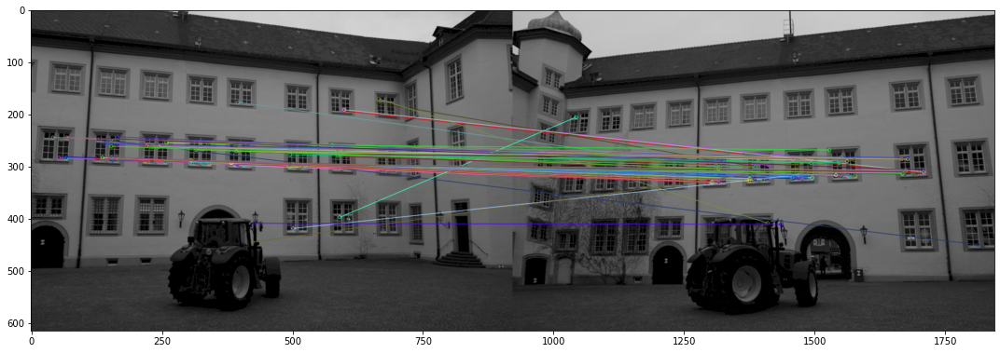

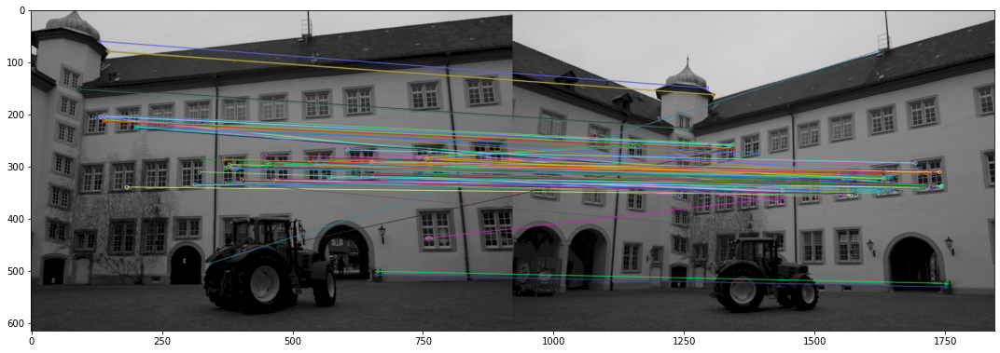

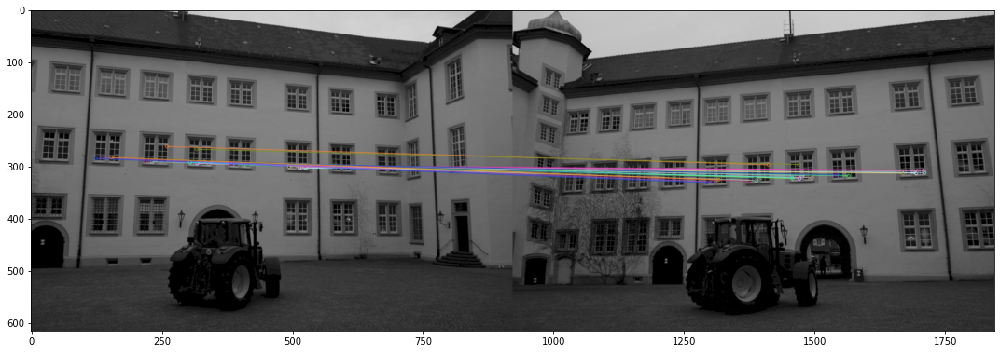

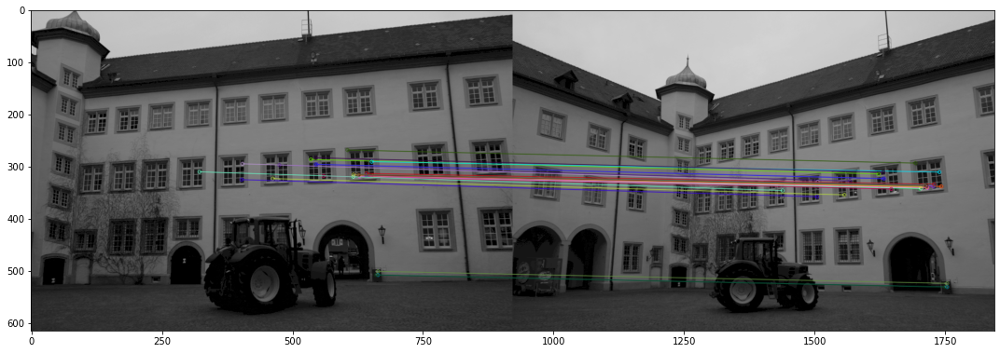

Mosaic saved as:
 mosaic_castle_int.png


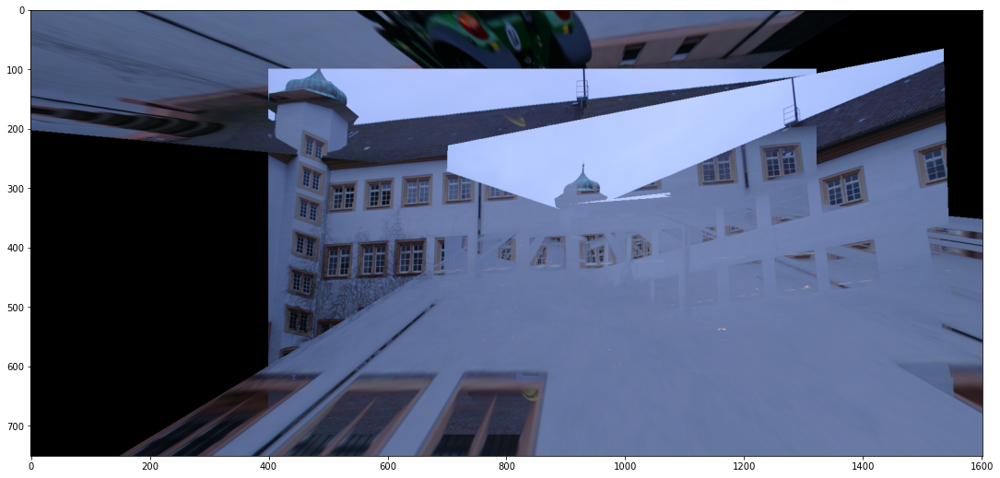

In [7]:
folder = ".\\Data\\castle_int"
image_mosaics(folder)

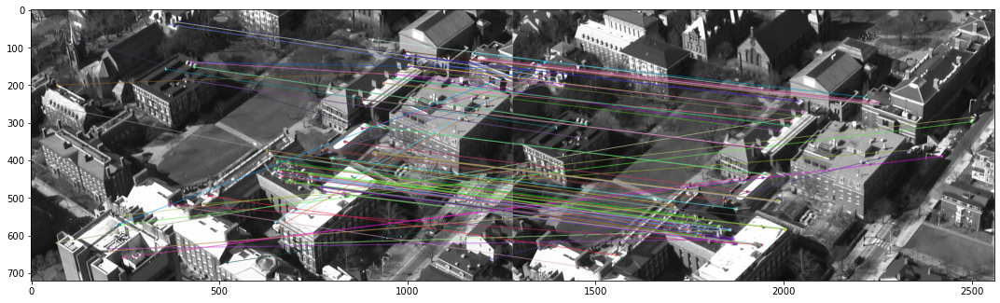

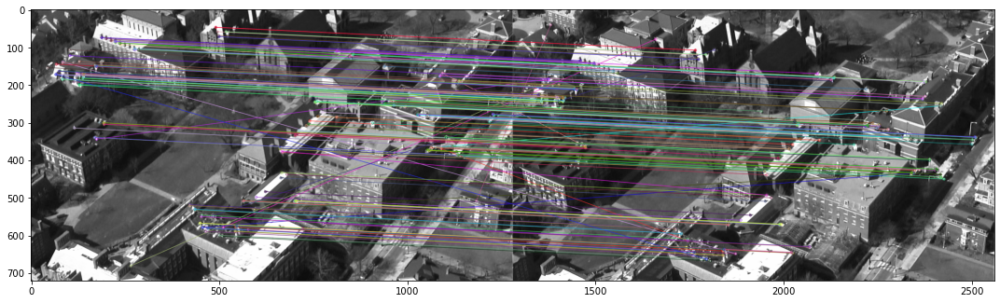

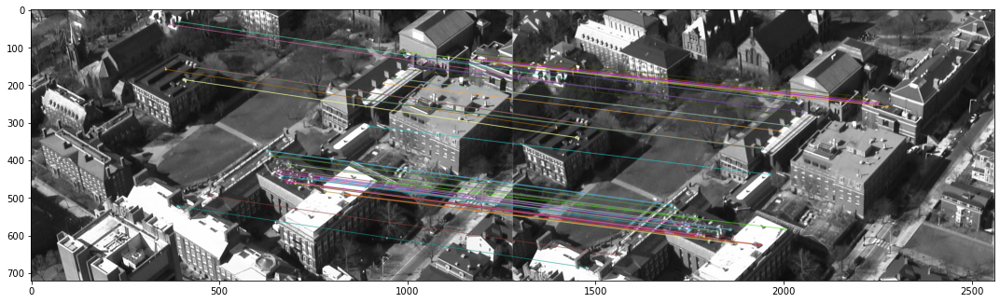

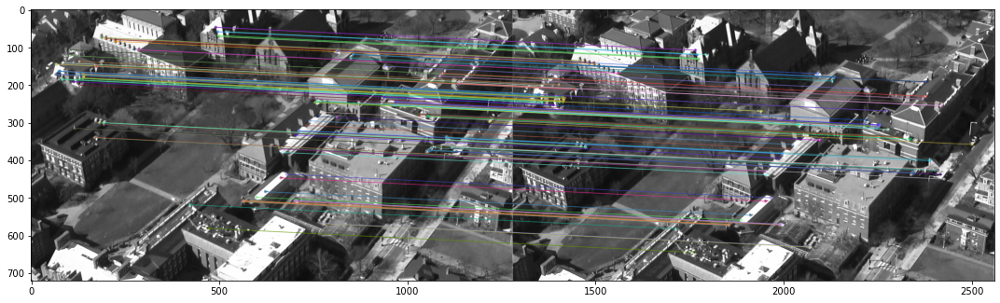

Mosaic saved as:
 mosaic_site13.png


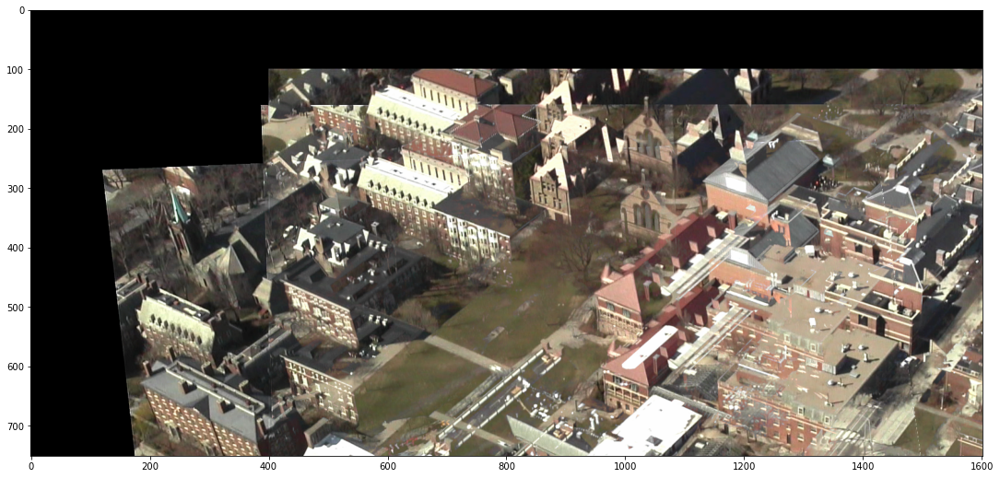

In [8]:
folder = ".\\Data\\aerial\\site13"
image_mosaics(folder)

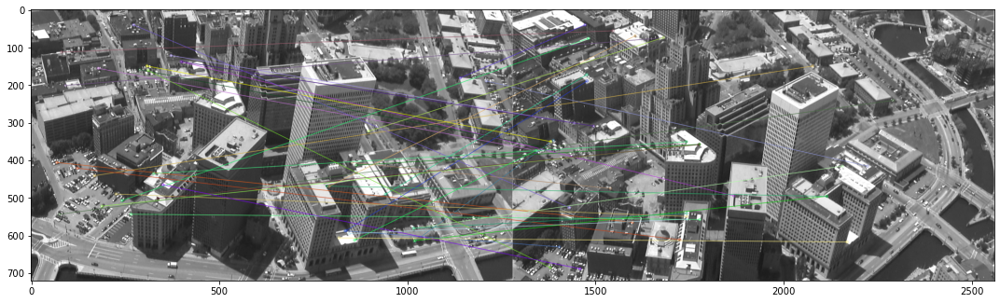

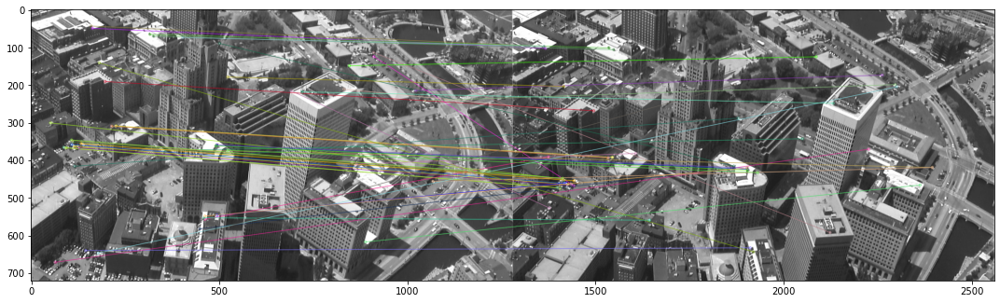

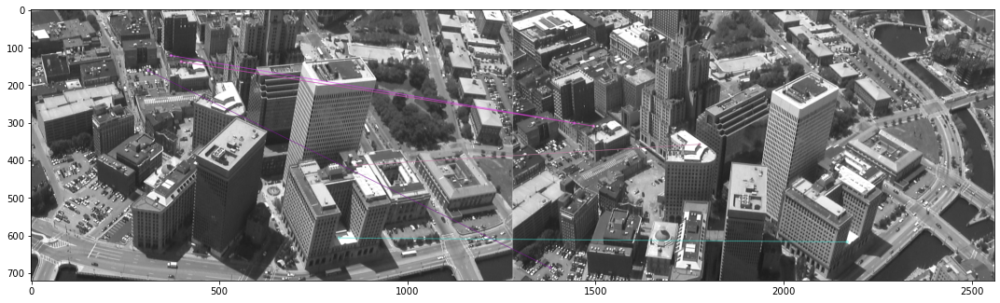

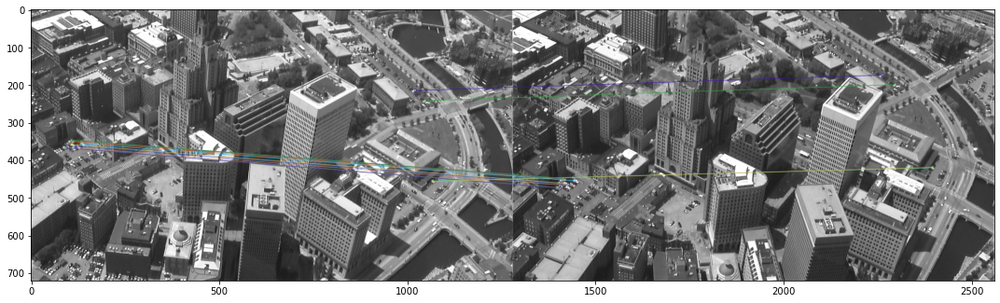

Mosaic saved as:
 mosaic_site22.png


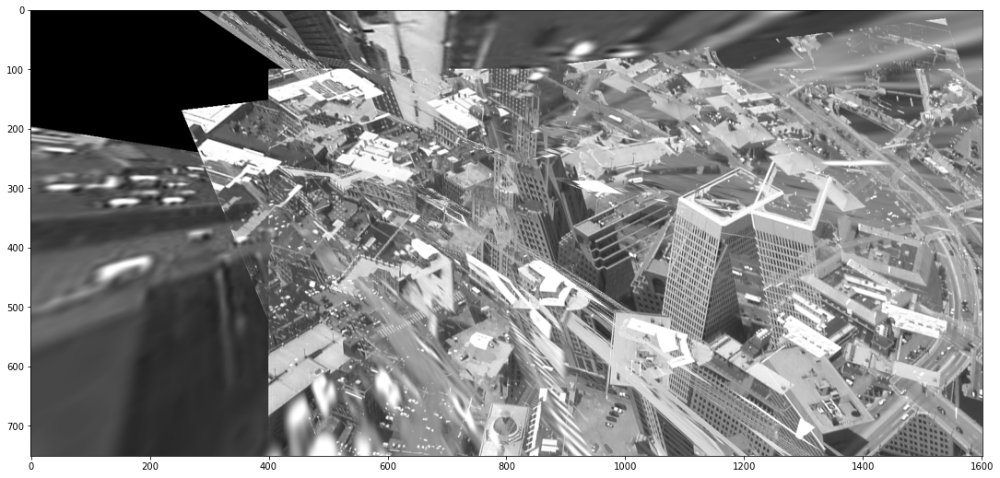

In [9]:
folder = ".\\Data\\aerial\\site22"
image_mosaics(folder)

## **3. Refinement of the estimated homography with the Gold Standard algorithm**

In order to refine the previous estimated homography we can minimize the geometric error with the Levenberg-Marquardt algorithm. For that we will call the function 'least_squares' with the proper input arguments that you have to complete. First, it is recommended to read the documentation of that function:

https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.least_squares.html

Notice that the first input is a function that only provides the vector of the residuals. The algorithm constructs the cost function as a sum of squares of the residuals. In our case the function is called 'geometric_error_terms' and you need to complete it.

More precisely, the tasks to perform are:


<span style='color:Green'> - Complete the function 'geometric_error_terms'. </span>

In [10]:
def geometric_error_terms(variables, data_points):

    # Unpack data_points
    pointsA, pointsB = data_points

    # Extract homography matrix H and keypoints locations from variables
    H = variables[:9].reshape(3, 3)
    pointsA_h = variables[9:].reshape(2, -1)

    # Homogeneous representation of pointsA_h
    pointsA_h_hom = np.vstack([pointsA_h, np.ones(shape=(1, pointsA_h.shape[1]))])

    # Project pointsA to image B using homography H
    pointsB_h = H @ pointsA_h_hom
    pointsB_h = pointsB_h / pointsB_h[2, :]
    pointsB_h = pointsB_h[:2, :]

    # Compute the vector of residuals as the reprojection error
    err1 = pointsA - pointsA_h
    err2 = pointsB - pointsB_h

    # Concatenate and flatten the residuals
    residuals = np.concatenate([err1.flatten(), err2.flatten()])

    return residuals


<span style='color:Green'> - Complete the code before calling function 'geometric_error_terms' in order to create the proper input of variables, 'variables0', to pass to the function. </span>

In [11]:
# inlier keypoints from images 1 and 2

points1_inl = points1[:,indices_inlier_matches_12]
points2_inl = points2[:,indices_inlier_matches_12]

# initial guess of the keypoint locations
points1_h = np.linalg.inv(H_12) @ points2_inl

# we want to refine the homography H and the keypoint locations
variables0 = np.concatenate([H_12.flatten(), points1_h[:2,:].flatten()])

# data points: argument of the function 'geometric_error_terms'
points = [points1_inl[:2,:], points2_inl[:2,:]]

result = least_squares(geometric_error_terms, variables0, method='lm', args=([points]))

<span style='color:Green'> - Extract the refined homogaphy and the refined keypoint locations from the output, 'result', of function 'geometric_error_terms'.  </span>


In [12]:
H_12_ref = result.x[:9].reshape(3,3)
points1_ref = result.x[9:].reshape(2,-1)

<span style='color:Green'> - To better compare the two homographies (refined and non refined) compute and print the geometric error before and after the refinement. </span>

In [13]:
# geometric error before the refinement

variables_non_ref = np.concatenate([H_12.flatten(), points1_h[:2,:].flatten()])
err_non_ref = geometric_error_terms(variables_non_ref, points)

# represent the geometric error as a sum of squares of the residuals
err_non_ref = np.sum(err_non_ref**2)

# geometric error after the refinement

variables_ref = np.concatenate([H_12_ref.flatten(), points1_ref[:2,:].flatten()])
err_ref = geometric_error_terms(variables_ref, points)
err_ref = np.sum(err_ref**2)

print(f'Geometric error before the refinement: {err_non_ref:.2f}')
print(f'Geometric error after the refinement: {err_ref:.2f}')

Geometric error before the refinement: 1017833911760.29
Geometric error after the refinement: 751862.71


#### Doing the same for image 2 and 3

In [19]:
# Homography between images 2 and 3
points2, points3, H_23, indices_inlier_matches_23 = estimate_homography_inliers(kp2,kp3,good_matches_23)
inlier_matches_23 = itemgetter(*indices_inlier_matches_23)(good_matches_23)

# inlier keypoints from images 2 and 3
points2_inl = points2[:,indices_inlier_matches_23]
points3_inl = points3[:,indices_inlier_matches_23]

# initial guess of the keypoint locations
points2_h = np.linalg.inv(H_23) @ points3_inl

# we want to refine the homography H and the keypoint locations
variables0 = np.concatenate([H_23.flatten(), points2_h[:2,:].flatten()])

# data points: argument of the function 'geometric_error_terms'
points = [points2_inl[:2,:], points3_inl[:2,:]]

result = least_squares(geometric_error_terms, variables0, method='lm', args=([points]))

# refined homography and keypoints locations
H_23_ref = result.x[:9].reshape(3,3)
points2_ref = result.x[9:].reshape(2,-1)

# geometric error before the refinement:
variables_non_ref = np.concatenate([H_23.flatten(), points2_h[:2,:].flatten()])
err_non_ref = geometric_error_terms(variables_non_ref, points)
err_non_ref = np.sum(err_non_ref**2)

# geometric error after the refinement:
variables_ref = np.concatenate([H_23_ref.flatten(), points2_ref[:2,:].flatten()])
err_ref = geometric_error_terms(variables_ref, points)
err_ref = np.sum(err_ref**2)

print(f'Geometric error before the refinement: {err_non_ref:.2f}')
print(f'Geometric error after the refinement: {err_ref:.2f}')

Geometric error before the refinement: 1987828827073.72
Geometric error after the refinement: 93.62


<span style='color:Green'> - Refine the homography 23 with the Gold Standard algorithm and visualize the differences in the keypoint locations. </span>

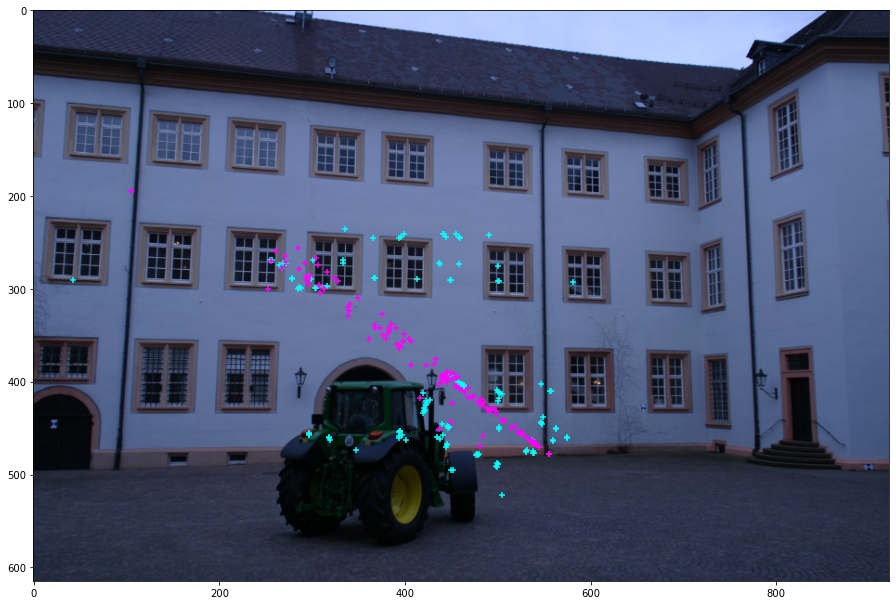

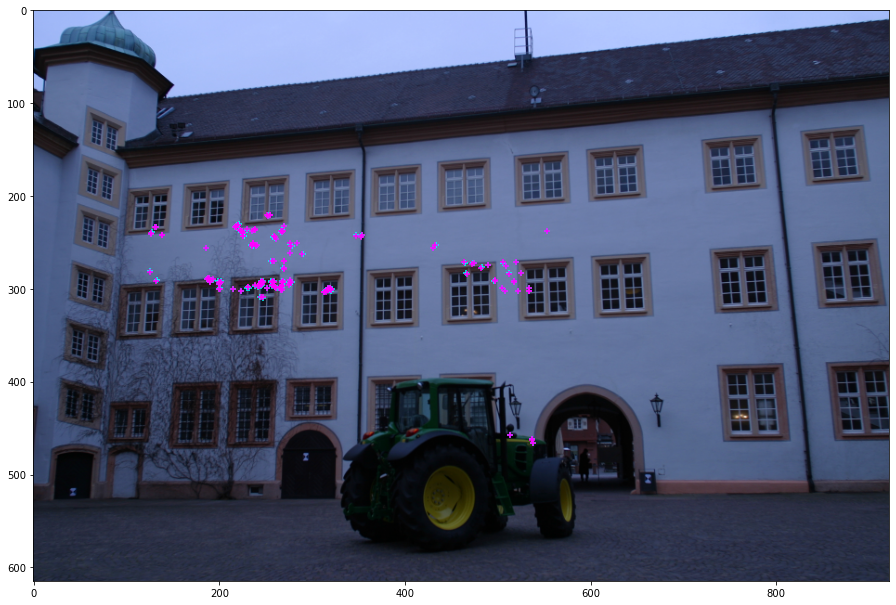

In [20]:
# display points and refined points

def show_points_refined(imgA, pointsA, pointsA_ref):
    imgA = cv2.cvtColor(imgA, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots()
    ax.imshow(imgA)
    ax.scatter(pointsA[0,:],pointsA[1,:], c='cyan', marker='+')
    ax.scatter(pointsA_ref[0,:],pointsA_ref[1,:], c='fuchsia', marker='+')
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()
    return

img1c = cv2.imread('Data/castle_int/0014_s.png',cv2.IMREAD_COLOR)
img2c = cv2.imread('Data/castle_int/0015_s.png',cv2.IMREAD_COLOR)
img3c = cv2.imread('Data/castle_int/0016_s.png',cv2.IMREAD_COLOR)

show_points_refined(img1c, points1_inl, points1_ref)
show_points_refined(img2c, points2_inl, points2_ref)

<span style='color:Green'> - Build mosaic with the refined homographies. </span>

TODO

In [21]:
def create_mosaic(img1c, img2c, img3c, corners, H_12, H_23, output_filename='', save=False):
    # Convert images to RGB format
    img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
    img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
    img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

    # Apply homographies to images
    img1c_w = apply_H_fixed_image_size(img1c, H_12, corners)
    img2c_w = apply_H_fixed_image_size(img2c, np.eye(3), corners)
    img3c_w = apply_H_fixed_image_size(img3c, np.linalg.inv(H_23), corners)

    # Ensure images have consistent datatype and color channels
    img1c_w = img1c_w.astype(np.uint8)
    img2c_w = img2c_w.astype(np.uint8)
    img3c_w = img3c_w.astype(np.uint8)

    # Combine images to create the mosaic
    img_mosaic = np.maximum(img3c_w, np.maximum(img1c_w, img2c_w))

    # Display the mosaic
    plt.figure(figsize=(12, 8))

    plt.subplot(131)
    plt.imshow(img1c)
    plt.title('Image 1')

    plt.subplot(132)
    plt.imshow(img2c)
    plt.title('Image 2')

    plt.subplot(133)
    plt.imshow(img3c)
    plt.title('Image 3')

    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(img_mosaic)
    plt.title('Mosaic')
    plt.show()

In [22]:
def create_mosaic(img1c, img2c, img3c, corners, H_12, H_23, output_filename='', save=False):
    img1c = cv2.cvtColor(img1c, cv2.COLOR_BGR2RGB)
    img2c = cv2.cvtColor(img2c, cv2.COLOR_BGR2RGB)
    img3c = cv2.cvtColor(img3c, cv2.COLOR_BGR2RGB)

    img1c_w = apply_H_fixed_image_size(img1c, H_12, corners)
    img2c_w = apply_H_fixed_image_size(img2c, np.eye(3), corners)
    img3c_w = apply_H_fixed_image_size(img3c, np.linalg.inv(H_23), corners)

    img_mosaic = np.maximum(img3c_w,np.maximum(img1c_w,img2c_w))
    plot_img(img_mosaic)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)

Before refinement:
After refinement:


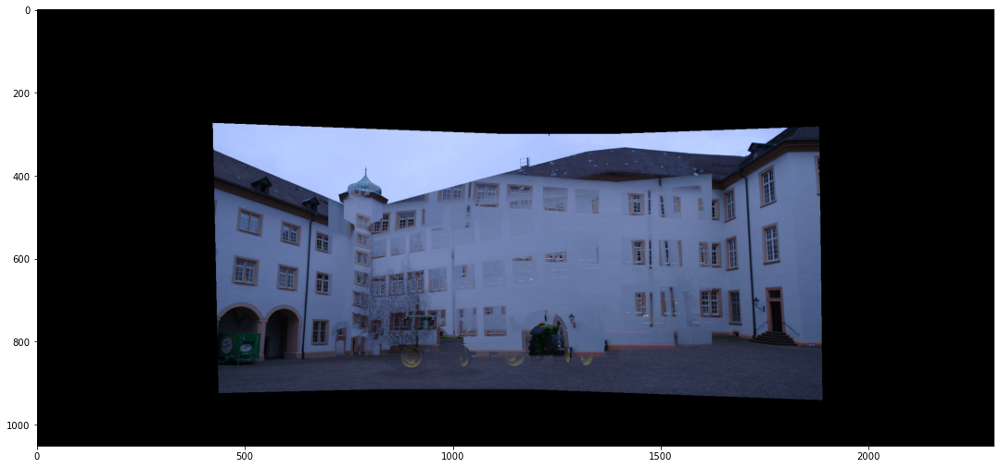

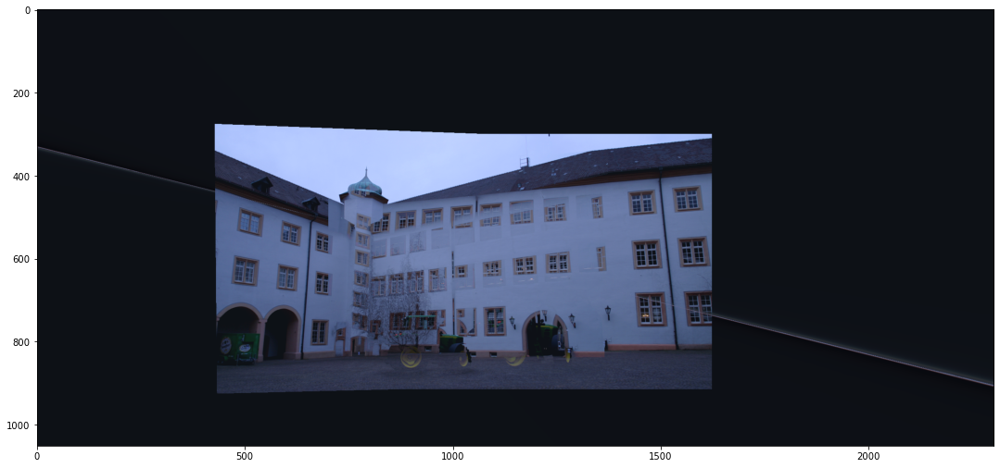

In [23]:
corners = [-700, 1600, -300, 750]

# Before refinement
print('Before refinement:')
create_mosaic(img1c, img2c, img3c, corners, H_12, H_23)

# After refinement
print('After refinement:')
create_mosaic(img1c, img2c, img3c, corners, H_12_ref, H_23_ref)


## **4. Application: Calibration with a planar pattern and augmented reality**

As we have seen in class, we can calibrate a camera with a planar pattern with Zhang's algorithm. A key aspect of this algorithm is the estimation of a homography that relates a pair of images, in particular, the template image and an image of it taken with the camera we want to calibrate. Once the camera is calibrated and we have recovered the relative pose between the camera and the planar pattern we can properly insert a virtual object on top of the flat pattern in a way that it is consistent, in a perspective sense, with rest of the scene.

### **4.1 Camera calibration**

The following code calibrates a camera using N (where N greater or equal than three) views of the planar pattern. Most of the code is provided but there are parts you need to complete. These parts are indicated in green before the corresponding cell code.


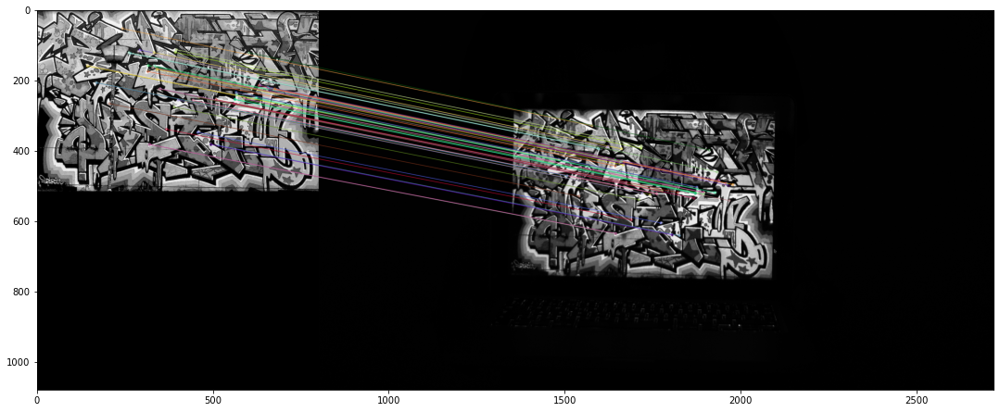

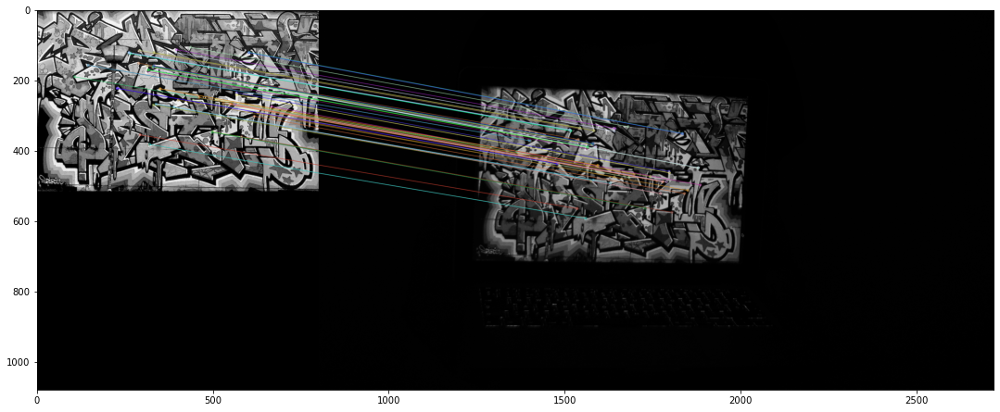

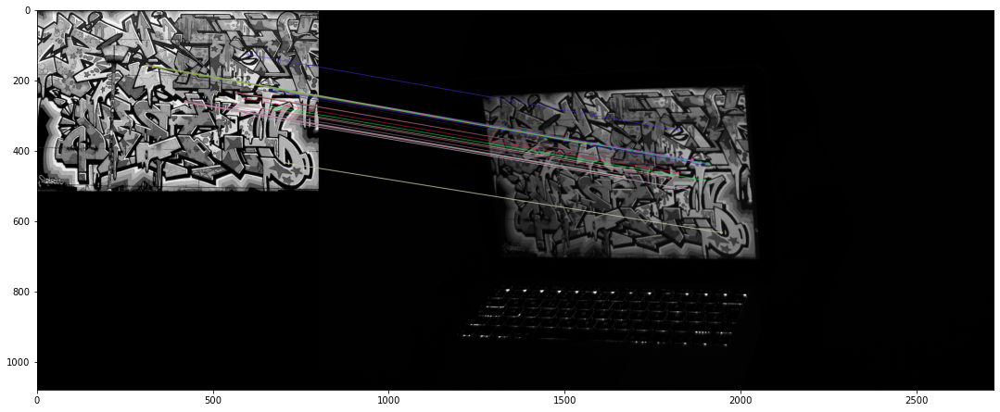

In [24]:
# Read template image and calibration images
template = cv2.imread('Data/calib/template.jpg',cv2.IMREAD_GRAYSCALE)
images = []
N = 3 # 3, 4, or 5
for i in range(1,N+1):
    m = cv2.imread("Data/calib/graffiti{0}.tif".format(i),cv2.IMREAD_GRAYSCALE)
    images.append(m)

# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints and descriptors with ORB
kpt, dest = orb.detectAndCompute(template,None)
kpi, desi = [], []
for m in images:
    kp, des = orb.detectAndCompute(m,None)
    kpi.append(kp)
    desi.append(des)

# Keypoint matching and homography estimation
bf = cv2.BFMatcher()
H = []
for i in range(N):
    matches = bf.knnMatch(dest,desi[i],k=2)
    # Apply ratio test
    good_matches = []
    for m,n in matches:
        if m.distance < 0.85*n.distance:
            good_matches.append([m])
    
    # Fit homography and remove outliers
    points1 = []
    points2 = []
    for m in good_matches:
        points1.append([kpt[m[0].queryIdx].pt[0], kpt[m[0].queryIdx].pt[1], 1])
        points2.append([kpi[i][m[0].trainIdx].pt[0], kpi[i][m[0].trainIdx].pt[1], 1])
    
    points1 = np.asarray(points1)
    points1 = points1.T
    points2 = np.asarray(points2)
    points2 = points2.T
    
    Hi, indices_inlier_matches = Ransac_DLT_homography2(points1, points2, 3, 1000)
    H.append(Hi)
    
    # Show inlier matches
    inlier_matches = itemgetter(*indices_inlier_matches)(good_matches)
    img_12 = cv2.drawMatchesKnn(template,kpt,images[i],kpi[i],inlier_matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(img_12)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()


<span style='color:Green'> - Complete the code that computes the Image of the Absolute Conic. </span>

<span style='color:Green'> - Complete the code that computes the matrix of internal parameters, K. </span>

Note: there is a linalg.cholesky function both in numpy and scipy, you have to read the documentation of both and find out which is the proper one to use here.

<span style='color:Green'> - In the report, make some comments related to the obtained internal camera parameters and also comment their relation to the image size. </span>

In [25]:
# Compute the Image of the Absolute Conic ...

# being hi the column i of the homography matrix
def vij(hi,hj):
    return np.array([[hi[0]*hj[0], 
                      hi[0]*hj[1] + hi[1]*hj[0], 
                      hi[0]*hj[2] + hi[2]*hj[0], 
                      hi[1]*hj[1], 
                      hi[1]*hj[2] + hi[2]*hj[1],
                      hi[2]*hj[2]]])

V = np.empty(shape=(2*N, 6))

# we compute 2 equations for each view of the planar pattern
for i in range(N):
    Hi = H[i]
    
    h1 = Hi[:,0]
    h2 = Hi[:,1]
    h3 = Hi[:,2]

    v12 = vij(h1,h2)
    v11 = vij(h1,h1)
    v22 = vij(h2,h2)

    V[2*i, :] = v12
    V[2*i+1, :] = (v11-v22)

U,D,UT = np.linalg.svd(V)

# the function 'numpy.linalg.svd' returns the last matrix (UT) transposed, so omega (the singular vector
# associated to the smallest singular value) is the last row (and not column) of UT
omega = UT[-1,:]

# image of the Absolut Conic
w = np.array([[omega[0], omega[1], omega[2]], 
              [omega[1], omega[3], omega[4]],
              [omega[2], omega[4], omega[5]]])

print(f'w:\n{w}')



w:
[[-1.29369088e-07 -2.32380792e-09  1.17988547e-04]
 [-2.32380792e-09 -1.30109049e-07  1.03658978e-04]
 [ 1.17988547e-04  1.03658978e-04 -9.99999988e-01]]


In [26]:
# Compute the matrix of internal parameters, K ...

import scipy.linalg

# note that the cholesky decomposition returns A = M^t*M, but the image of the Absolut
# Conic w = K^(-t)*K^(-1), so we need to invert the result of scipy.linalg.cholesky(w)
Kinv = scipy.linalg.cholesky(w)
K = np.linalg.inv(Kinv)

print(f'K:\n{K}')

LinAlgError: 1-th leading minor of the array is not positive definite

In [27]:
Kinv = np.linalg.cholesky(w)
K = np.linalg.inv(Kinv)

print(f'K:\n{K}')

LinAlgError: Matrix is not positive definite

<span style='color:Green'> - Complete the calculation of r1, r2, and ti in the code below. </span>

In [ ]:
# Compute camera position and orientation
import math
R = []
t = []
P = []

for i in range(N):
    # compute r1, r2, and t{i}
    h = H[i]
    r1 = Kinv @ h[:,0]
    r2 = Kinv @ h[:,1]
    ti = Kinv @ h[:,2]
    
    # Solve the scale ambiguity by forcing r1 and r2 to be unit vectors.
    s = math.sqrt(np.linalg.norm(r1) * np.linalg.norm(r2)) * np.sign(ti[2])
    r1 = r1 / s
    r2 = r2 / s
    ti = ti / s
    t.append(ti)
    Ri = np.array([r1, r2, np.cross(r1,r2)])
    Ri = Ri.T
    
    # Ensure R is a rotation matrix
    U, d, Vt = np.linalg.svd(Ri)
    Ri = U @ np.identity(3) @ Vt
    R.append(Ri)
   
    # Pi = K * [Ri ti]
    A = np.zeros((3,4))
    A[:3,:3] = Ri
    A[:,3] = ti
    Pi = K @ A
    P.append(Pi)

The following code (no need to be completed) draws the planar pattern and the N camera locations (position and orientation).

<span style='color:Green'> - Take a look to the provided code for that and in the report explain how the optical center is computed. </span>

In [ ]:
import plotly.graph_objects as go
from utils import plot_camera, plot_image_origin

ny, nx = images[0].shape

fig = go.Figure()
for i in range(N):
    plot_camera(P[i], nx, ny, fig, "camera{0}".format(i))

plot_image_origin(nx, ny, fig, "image")

fig.show()

Alternatively, we can draw a fixed camera and N planar patterns at different relative poses with respect to the camera.

<span style='color:Green'> -Complete the function ' plot_image_Rt' in order to achieve that. Note: it may be useful to look at function 'plot_image_origin' in utils.py</span>

In [ ]:
def plot_image_Rt(R,t,w, h, fig, legend):
    # we rotate and translate the x,y,z corners of each image with the corresponding extrinsics R,t
    Rt = np.column_stack([R, t])
    p1 = Rt @ np.array([0, 0, 0, 1])
    p2 = Rt @ np.array([w, 0, 0, 1])
    p3 = Rt @ np.array([w, h, 0, 1])
    p4 = Rt @ np.array([0, h, 0, 1])

    x = np.array([p1[0], p2[0], p3[0], p4[0], p1[0]])
    y = np.array([p1[1], p2[1], p3[1], p4[1], p1[1]])
    z = np.array([p1[2], p2[2], p3[2], p4[2], p1[2]])

    fig.add_trace(go.Scatter3d(x=x, y=z, z=-y, mode='lines',name=legend))
    
    return

fig = go.Figure()
A = np.zeros((3,4))
A[0,0]=A[1,1]=A[2,2]=1

plot_camera(K@A, nx, ny, fig, "camera")
for i in range(N):
    plot_image_Rt(R[i], t[i], nx, ny, fig, "image{0}".format(i))

fig.show()

### **4.2 OPTIONAL. Augmented reality**

The following code (no need to be completed) draws a simple 3D virtual object (a cube) on top of the flat pattern.

<span style='color:Green'> - Analyse the provided code and in the report explain how the virtual object is inserted in the image and why the camera view needs to be calibrated. </span>

In [ ]:
Th, Tw = template.shape
cube_corners = np.array([[0, 0, 0], [1, 0, 0], [1, 1, 0], [0, 1, 0], [0, 0, 0], [0, 0, 1], [1, 0, 1], [1, 1, 1], [0, 1, 1], [0, 0, 1], [0, 0, 0], [1, 0, 0], [1, 0, 1], [0, 0, 1], [0, 0, 0], [0, 1, 0], [1, 1, 0], [1, 1, 1], [0, 1, 1], [0, 1, 0]])

import numpy.matlib
offset = np.array([Tw/2, Th/2, -Tw/8])
M = cube_corners.shape[0]
X = (cube_corners - 0.5) * Tw/ 4 + np.matlib.repmat(offset, M, 1)

X = X.T
ones = np.ones(M)
Xh = np.stack((X[0,:], X[1,:], X[2,:], ones), axis=0)

line_color = (0, 255, 0)

for i in range(N):
    
    xp = P[i]@Xh
    xp = xp / xp[2,:]
    xp = xp.astype(int)
    
    image = cv2.imread("Data/calib/graffiti{0}.tif".format(i+1),cv2.IMREAD_COLOR)
    image_gray = image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_gray[:, :, 0] = gray[:, :]
    image_gray[:, :, 1] = image_gray[:, :, 0]
    image_gray[:, :, 2] = image_gray[:, :, 0]
    for j in range(M-1):
        image = cv2.line(image_gray, (xp[0,j],xp[1,j]), (xp[0,j+1],xp[1,j+1]), line_color, 4) 
    plt.imshow(image)
    fig = matplotlib.pyplot.gcf()
    fig.set_size_inches(18.5, 10.5)
    plt.show()


## **5. OPTIONAL. Application: Logo detection**

<span style='color:Green'> - Detect the UPF logo in the two UPF images using the DLT algorithm (folder "logos").
Interpret and comment the results. </span>

In [ ]:
upf_logo = cv2.imread('Data/logos/logoUPF.png',cv2.IMREAD_GRAYSCALE)
upf_building = cv2.imread('Data/logos/UPFbuilding.jpg',cv2.IMREAD_GRAYSCALE)

# using the size of the image 'logoUPF'
h, w = upf_logo.shape

# Manually selected corners of the UPF logo in the building image
corners_logo_img = np.array([[0, w, w, 0],
                             [0, 0, h, h],
                             [1, 1, 1, 1]])

# manually selected corners of the UPF logo in the building image
corners_logo_building = np.array([[316, 423, 417, 306],
                                  [52, 66, 143, 130],
                                  [1, 1, 1, 1]])

# estimate the homography using the 4 correspondences
H_building_manual = DLT_homography(corners_logo_img, corners_logo_building)


In [ ]:
# estimated corners of the UPF logo in the building image
corners_logo_building_h = H_building_manual @ corners_logo_img
corners_logo_building_h = np.transpose(corners_logo_building_h[:2, :] / corners_logo_building_h[2, :])

# read the UPF building image
upf_building_c = cv2.imread('Data/logos/UPFbuilding.jpg', cv2.IMREAD_COLOR)
upf_building_c = cv2.cvtColor(upf_building_c, cv2.COLOR_BGR2RGB)

# draw the detected logo on the building image
upf_building_c_detected = cv2.polylines(np.copy(upf_building_c),
                                        [corners_logo_building_h.reshape(-1, 1, 2).astype('int32')],
                                        isClosed=True, color=(255, 0, 0), thickness=10)

# plot the image with detected logo
plot_img(upf_building_c_detected)

In [ ]:
def logo(imgA, imgB, H, corners):
    imgA_w = apply_H_fixed_image_size(imgA, H, corners)
    imgB_w = apply_H_fixed_image_size(imgB, np.eye(3), corners)

    img_mosaic = np.maximum(imgA_w, imgB_w)
    
    # Display the mosaic
    plot_img(img_mosaic)
    
    # Set the figure size
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)

    # Convert the mosaic to BGR format for OpenCV compatibility
    img_mosaic = cv2.cvtColor(img_mosaic, cv2.COLOR_RGB2BGR)

# Read the UPF logo image
upf_logo_c = cv2.imread('Data/logos/logoUPF.png', cv2.IMREAD_COLOR)
upf_logo_c = cv2.cvtColor(upf_logo_c, cv2.COLOR_BGR2RGB)

# Corners of the canvas where the mosaic will be created
corners_canvas = [0, upf_building_c.shape[1], 0, upf_building_c.shape[0]]

# Call the logo function
logo(upf_logo_c, upf_building_c, H_building_manual, corners_canvas)

In [ ]:
# manually selected corners of the UPF logo 
corners_logo_building_wrong = np.array([[316, 423, 417, 306], 
                                      [52, 66, 143, 130],
                                      [1, 1, 1, 1]])

# estimate the homography 
H_building_wrong = DLT_homography(corners_logo_img, corners_logo_building_wrong)

# estimated corners of the UPF logo 
corners_logo_building_h_wrong = H_building_wrong @ corners_logo_img
corners_logo_building_h_wrong = np.transpose(corners_logo_building_h_wrong[:2, :] / corners_logo_building_h_wrong[2, :])

# visualize the detected logo 
upf_building_c_detected_wrong = cv2.polylines(np.copy(upf_building_c), 
                                             [corners_logo_building_h_wrong.reshape(-1, 1, 2).astype('int32')], 
                                             isClosed=True, color=(255, 0, 0), thickness=10)

# display the image with the detected logo 
plot_img(upf_building_c_detected_wrong)

# create mosaic
logo(upf_logo_c, upf_building_c, H_building_wrong, corners_canvas)

UPF stand

In [ ]:
# Image UPFStand
upf_stand = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_GRAYSCALE)
upf_stand_c = cv2.imread('Data/logos/UPFstand.jpg',cv2.IMREAD_COLOR)
upf_stand_c = cv2.cvtColor(upf_stand_c, cv2.COLOR_BGR2RGB)

# manually selected corners of the UPF logo 
corners_logo_stand = np.array([[168, 259, 263, 174], 
                               [148, 155, 267, 275],
                               [1, 1, 1, 1]])

# estimate the homography 
H_stand_manual = DLT_homography(corners_logo_img, corners_logo_stand)

# estimated corners of the UPF logo 
corners_logo_stand_h = H_stand_manual @ corners_logo_img
corners_logo_stand_h = np.transpose(corners_logo_stand_h[:2, :] / corners_logo_stand_h[2, :])

# visualize the detected logo 
upf_stand_c_detected = cv2.polylines(np.copy(upf_stand_c), 
                                    [corners_logo_stand_h.reshape(-1, 1, 2).astype('int32')], 
                                    isClosed=True, color=(0, 0, 255), thickness=2)

# display the image with the detected logo 
plot_img(upf_stand_c_detected)


In [ ]:
# corners of the canvas where the mosaic will be created
corners_canvas = [0, upf_stand_c.shape[1], 0, upf_stand_c.shape[0]]

logo(upf_logo_c, upf_stand_c, H_stand_manual, corners_canvas)

## **6. OPTIONAL. Application: Logo replacement**

<span style='color:Green'> - Replace the UPF logo by the master logo in one of the previous images using the DLT algorithm. </span>


In [ ]:
# load the mcv logo and RESIZE it to the size of the upf logo
mcv_logo_c = cv2.imread('Data/logos/logo_master.png',cv2.IMREAD_COLOR)
mcv_logo_c = cv2.resize(mcv_logo_c, (upf_logo.shape[1],upf_logo.shape[0]))
mcv_logo_c = cv2.cvtColor(mcv_logo_c, cv2.COLOR_BGR2RGB)

# corners of the canvas where the mosaic will be created
corners_canvas = [0, upf_building.shape[1], 0, upf_building.shape[0]]

logo(mcv_logo_c, upf_building_c, H_building_manual, corners_canvas)

In [ ]:
# corners of the canvas where the mosaic will be created
corners_canvas = [0, upf_stand.shape[1], 0, upf_stand.shape[0]]

logo(mcv_logo_c, upf_stand_c, H_stand_manual, corners_canvas)